# Fraud Detection with Machine Learning

Author: Yordan Ivanov Yordanov

## Abstract

    Financial fraud is an ever growing problem with far reahing consequences in the financial industry. Machine learning had played a major role in the detection of credit card fraud in online transactions. I have used a synthetic financial datasets for fraud detection from Kaggle, containing 6362620 transactions to find out which would be the best approach in detecting fraudulent transactions.

## Goal

Classify the genuine and the fraudulent transactions as accuretely as possible.

## Overview 

1. Data Acquisition
2. Imports
3. Loding data
4. Exploratory Data Analysis
	4.1 Summary of the Data
	4.2 Exploring the Features
		4.2.1 Step
		4.2.2 Type
		4.2.3 Amount
		4.2.4 nameOrig and nameDest
		4.2.5 Looking at the balances before and after the transactions
		4.2.6 isFraud
		4.2.7 isFlaggedFraud
5. Pre-processing Data
	5.1 Handling Categorical Variables
	5.2 Splitting and Standardizing Data
		5.2.1 Setting random_state and seed so that the training/testing splits and model results are reproducible
		5.2.2 Creating training, validation, and testing sets
		5.2.3 Normalizing data so that all variables follow the same scale (0 to 1)
6. Model Selection
	Evaluating the models
		- Accuracy classification score
		- F1 score, also known as balanced F-score or F-measure
		- Precision-Recall
		- Confusion Matrix
		- Precision
		- Recall
		- Receiver Operating Characteristic Curve (ROC AUC) from prediction scores
	6.1 Logistic Regression
		6.1.1 Logistic Regression
		6.1.2 Tuning the Logistic Regression Model
		6.1.3 Best Logistic Regression Model
		6.1.4 Logistic Regression with Polynomial Features
	6.2 Decision Tree
		6.2.1 Decision Tree
		6.2.2 Tuning the Decision Tree
		6.2.3 Best Decision Tree
	6.3 Random Forest
		6.3.1 Random Forest
		6.3.2 Tuning the Random Forest
		6.3.3 Best Random Forest
	6.4 K-Nearest Neighbors (KNN)
		6.4.1 K-Nearest Neighbors
		6.4.2 Tunning the KNN-Classifier
		6.4.3 Best K-Nearest Neighbors
	6.5 SVM - Support Vector Machines
		6.5.1 SVM
		6.5.2 Tunning the SVM
		6.5.3 Best SVM
7. Testing the best classifier with the unknown testing data
8. Conclusion
9. Pickling
10. Resourses

## 1. Data Acquisition

https://www.kaggle.com/ntnu-testimon/paysim1

There is a lack of public available datasets on financial services and specially in the emerging mobile money transactions domain. Financial datasets are important to many researchers and in particular to us performing research in the domain of fraud detection. Part of the problem is the intrinsically private nature of financial transactions, that leads to no publicly available datasets.

We present a synthetic dataset generated using the simulator called PaySim as an approach to such a problem. PaySim uses aggregated data from the private dataset to generate a synthetic dataset that resembles the normal operation of transactions and injects malicious behaviour to later evaluate the performance of fraud detection methods.

Content PaySim simulates mobile money transactions based on a sample of real transactions extracted from one month of financial logs from a mobile money service implemented in an African country. The original logs were provided by a multinational company, who is the provider of the mobile financial service which is currently running in more than 14 countries all around the world.

This synthetic dataset is scaled down 1/4 of the original dataset and it is created just for Kaggle.

Headers This is a sample of 1 row with headers explanation:

1,PAYMENT,1060.31,C429214117,1089.0,28.69,M1591654462,0.0,0.0,0,0

step - maps a unit of time in the real world. In this case 1 step is 1 hour of time. Total steps 744 (30 days simulation).

type - CASH-IN, CASH-OUT, DEBIT, PAYMENT and TRANSFER.

amount - amount of the transaction in local currency.

nameOrig - customer who started the transaction

oldbalanceOrg - initial balance before the transaction

newbalanceOrig - new balance after the transaction

nameDest - customer who is the recipient of the transaction

oldbalanceDest - initial balance recipient before the transaction. Note that there is not information for customers that start with M (Merchants).

newbalanceDest - new balance recipient after the transaction. Note that there is not information for customers that start with M (Merchants).

isFraud - This is the transactions made by the fraudulent agents inside the simulation. In this specific dataset the fraudulent behavior of the agents aims to profit by taking control or customers accounts and try to empty the funds by transferring to another account and then cashing out of the system.

isFlaggedFraud - The business model aims to control massive transfers from one account to another and flags illegal attempts. An illegal attempt in this dataset is an attempt to transfer more than 200.000 in a single transaction.

Past Research There are 5 similar files that contain the run of 5 different scenarios. These files are better explained at my PhD thesis chapter 7 (PhD Thesis Available here http://urn.kb.se/resolve?urn=urn:nbn:se:bth-12932).

We ran PaySim several times using random seeds for 744 steps, representing each hour of one month of real time, which matches the original logs. Each run took around 45 minutes on an i7 intel processor with 16GB of RAM. The final result of a run contains approximately 24 million of financial records divided into the 5 types of categories: CASH-IN, CASH-OUT, DEBIT, PAYMENT and TRANSFER.

Acknowledgements This work is part of the research project ”Scalable resource-efficient systems for big data analytics” funded by the Knowledge Foundation (grant: 20140032) in Sweden.

Please refer to this dataset using the following citations:

PaySim first paper of the simulator:

E. A. Lopez-Rojas , A. Elmir, and S. Axelsson. "PaySim: A financial mobile money simulator for fraud detection". In: The 28th European Modeling and Simulation Symposium-EMSS, Larnaca, Cyprus. 2016

## 2. Imports

Here are the usual suspects!
- %matplotlib inline is a magic function, which displays the matplotlib graphs, directly below the code cell that produced it.
- pandas is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool.
- NumPy is a Python library that provides a multidimensional array object, various derived objects (such as masked arrays and matrices), and an assortment of routines for fast operations on arrays, including mathematical, logical, shape manipulation, sorting, selecting, I/O, discrete Fourier transforms, basic linear algebra, basic statistical operations, random simulation and much more.
- matplotlib.pyplot is a collection of functions that make matplotlib work like MATLAB. Each pyplot function makes some change to a figure: e.g., creates a figure, creates a plotting area in a figure, plots some lines in a plotting area, decorates the plot with labels, etc.
- XGBoost is one of the most popular machine learning algorithm these days. Seaborn is a library for making statistical graphics in Python. It builds on top of matplotlib and integrates closely with pandas data structures.
- sklearn Decision tree and random forest classifier.
- XGBoost is one of the most popular machine learning algorithm these days.

In [1]:
 %matplotlib inline

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

import random

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

from sklearn.model_selection import train_test_split

from sklearn.metrics import (f1_score, average_precision_score, accuracy_score, classification_report, precision_score, 
                             precision_recall_curve, plot_precision_recall_curve, recall_score, plot_confusion_matrix, 
                             roc_auc_score, roc_curve, confusion_matrix)
 
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve

from sklearn.linear_model import LogisticRegression, Ridge, Lasso, LinearRegression

from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import BaggingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from pprint import pprint

from sklearn.svm import LinearSVC, SVC

import pickle

## 3. Loding data

Time to load the data from the CSV file, and pray that the RAM is enough! 

In [3]:
data = pd.read_csv("D:\CSV\PS_20174392719_1491204439457_log.csv")

## 4. Exploratory Data Analysis


Here comes the fun part! Somebody, please grab a pair of scissors, we will shed some data.

Successfull machine learning requires good knowledge of the underlying data. This knowledge can help us:

- eliminate unnecessary observations/features,
- transform the remaining and create new ones.

In this section we will explore our data with Exploratory Data Analysis and at the same time reconstruct them. Before we start, let's take a look at the data.

### 4.1 Summary of the Data

- Let's have a look at the data info!

In [4]:
 data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6362620 entries, 0 to 6362619
Data columns (total 11 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            int64  
 1   type            object 
 2   amount          float64
 3   nameOrig        object 
 4   oldbalanceOrg   float64
 5   newbalanceOrig  float64
 6   nameDest        object 
 7   oldbalanceDest  float64
 8   newbalanceDest  float64
 9   isFraud         int64  
 10  isFlaggedFraud  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 534.0+ MB


- We will use data.describe() which generates descriptive statistics including those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.

In [5]:
data.describe()

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
count,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06
mean,2.433972e+02,1.798619e+05,8.338831e+05,8.551137e+05,1.100702e+06,1.224996e+06,1.290820e-03,2.514687e-06
std,1.423320e+02,6.038582e+05,2.888243e+06,2.924049e+06,3.399180e+06,3.674129e+06,3.590480e-02,1.585775e-03
min,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.560000e+02,1.338957e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,2.390000e+02,7.487194e+04,1.420800e+04,0.000000e+00,1.327057e+05,2.146614e+05,0.000000e+00,0.000000e+00
75%,3.350000e+02,2.087215e+05,1.073152e+05,1.442584e+05,9.430367e+05,1.111909e+06,0.000000e+00,0.000000e+00
max,7.430000e+02,9.244552e+07,5.958504e+07,4.958504e+07,3.560159e+08,3.561793e+08,1.000000e+00,1.000000e+00


- Now, please grab a seat, because we are about to find out how big our dataset is. 
PS: I am glad, I can't read your mind :) 

In [6]:
data.shape

(6362620, 11)

Now let's see, how the columns have been labled. 

- step - maps a unit of time in the real world. In this case 1 step is 1 hour of time. Total steps 744 (30 days simulation).
- type - CASH-IN, CASH-OUT, DEBIT, PAYMENT and TRANSFER.
- amount - amount of the transaction in local currency.
- nameOrig - customer who started the transaction
- oldbalanceOrg - initial balance before the transaction
- newbalanceOrig - new balance after the transaction
- nameDest - customer who is the recipient of the transaction
- oldbalanceDest - initial balance recipient before the transaction. Note that there is not information for customers that start with M (Merchants).
- newbalanceDest - new balance recipient after the transaction. Note that there is not information for customers that start with M (Merchants).
- isFraud - This is the transactions made by the fraudulent agents inside the simulation. In this specific dataset the fraudulent behavior of the agents aims to profit by taking control or customers accounts and try to empty the funds by transferring to another account and then cashing out of the system.
- isFlaggedFraud - The business model aims to control massive transfers from one account to another and flags illegal attempts. An illegal attempt in this dataset is an attempt to transfer more than 200.000 in a single transaction.

In [7]:
data.columns

Index(['step', 'type', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', 'isFraud',
       'isFlaggedFraud'],
      dtype='object')

Now pandas will do it's magic, and munch the data!

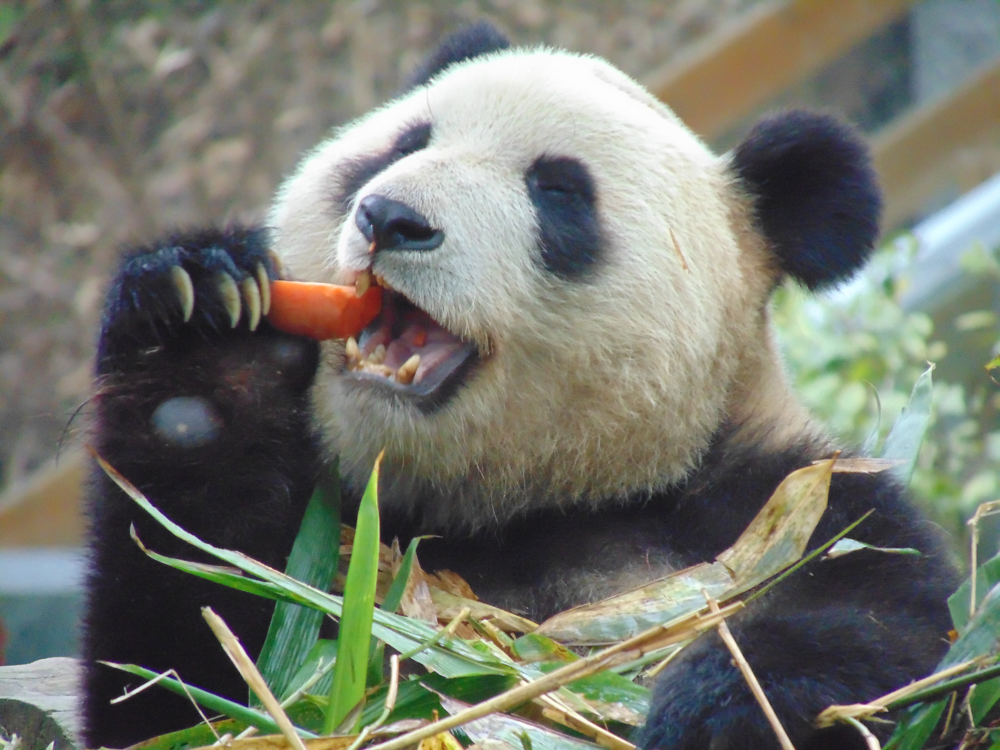

In [8]:
data.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0
1,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0
2,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0
3,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,1,0
4,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0,0


In [9]:
data.tail()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
6362615,743,CASH_OUT,339682.13,C786484425,339682.13,0.0,C776919290,0.00,339682.13,1,0
6362616,743,TRANSFER,6311409.28,C1529008245,6311409.28,0.0,C1881841831,0.00,0.00,1,0
6362617,743,CASH_OUT,6311409.28,C1162922333,6311409.28,0.0,C1365125890,68488.84,6379898.11,1,0
6362618,743,TRANSFER,850002.52,C1685995037,850002.52,0.0,C2080388513,0.00,0.00,1,0
6362619,743,CASH_OUT,850002.52,C1280323807,850002.52,0.0,C873221189,6510099.11,7360101.63,1,0


It's important to see if we have any missing values in the dataset. 

In [10]:
data.isnull().values.any()

False

In [11]:
data.isnull().sum()

step              0
type              0
amount            0
nameOrig          0
oldbalanceOrg     0
newbalanceOrig    0
nameDest          0
oldbalanceDest    0
newbalanceDest    0
isFraud           0
isFlaggedFraud    0
dtype: int64

### 4.2 Exploring the Features 

Now that we had a peek at the data it's time to explore each feature and find out what's useful and get rid of the rest. 
- I will start by creating a copy of the dataset, in case I need the original later. 

In [12]:
data_new = data.copy()

- I will assign a value of 1 for fraudulent and 0 for genuine tansactions. 

In [13]:
fraud = data_new[data_new["isFraud"] == 1]
valid = data_new[data_new["isFraud"] == 0]

### 4.2.1 Step 

- step is the time variable. In this case 1 step is 1 hour of time. Total steps 744 (30 days simulation).
- Let's see how the genuine and fradulent transactions are distributed within the space of 1 month. 

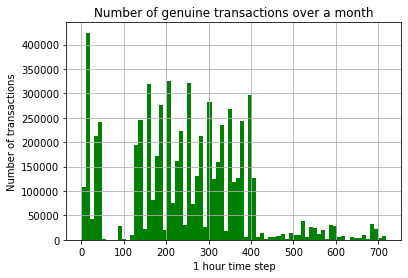

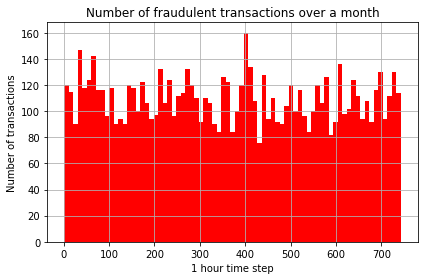

In [14]:
 bins = 75

valid.hist(column="step",color="green",bins=bins)
plt.xlabel("1 hour time step")
plt.ylabel("Number of transactions")
plt.title("Number of genuine transactions over a month")

fraud.hist(column ="step",color="red",bins=bins)
plt.xlabel("1 hour time step")
plt.ylabel("Number of transactions")
plt.title("Number of fraudulent transactions over a month")

plt.tight_layout()
plt.show()

It looks like fraudsters don't take a break!

- The fraudulent transactions take place uniformly throughout the month in contrast with the genuine transactions.

Now let's have a look at the transactions throughout a week. 

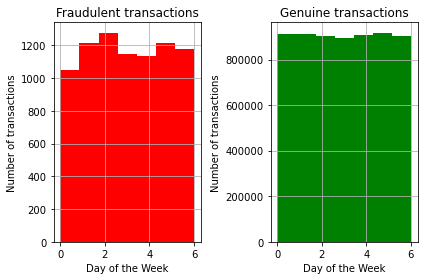

In [15]:
num_days = 7
num_hours = 24
fraud_days = fraud.step % num_days
fraud_hours = fraud.step % num_hours
valid_days = valid.step % num_days
valid_hours = valid.step % num_hours

plt.subplot(1, 2, 1)
fraud_days.hist(bins=num_days,color="red")
plt.title('Fraudulent transactions')
plt.xlabel('Day of the Week')
plt.ylabel("Number of transactions")

plt.subplot(1,2,2)
valid_days.hist(bins=num_days,color="green")
plt.title('Genuine transactions')
plt.xlabel('Day of the Week')
plt.ylabel("Number of transactions")

plt.tight_layout()
plt.show()

This shows that both genuine and fraudulent transactions take place in all days of the week.

- Now lets have a look at the transactions by the hours of the day.

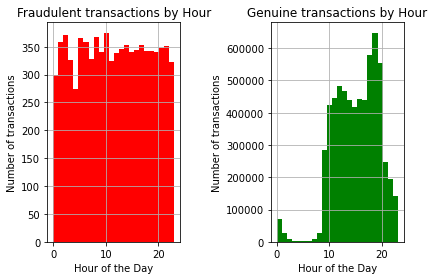

In [16]:
plt.subplot(1, 2, 1)
fraud_hours.hist(bins=num_hours, color="red")
plt.title('Fraudulent transactions by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel("Number of transactions")


plt.subplot(1, 2, 2)
valid_hours.hist(bins=num_hours, color="green")
plt.title('Genuine transactions by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel("Number of transactions")

plt.tight_layout()
plt.show()

It seems like fraudsters don't sleep either, since fradulent transactions take place uniformly throughout the day and night in contrsast with the genuine transactions which mostly take place during the day.

### 4.2.2 Type 

- These are the diferent kind of transactions; CASH-IN, CASH-OUT, DEBIT, PAYMENT and TRANSFER.

Let's have a look and see if we could find a direct correlation between the different types of transactions and fradulent behaviour!

- First let's count the number of data point in each type of transaction.

CASH_OUT    2237500
PAYMENT     2151495
CASH_IN     1399284
TRANSFER     532909
DEBIT         41432
Name: type, dtype: int64


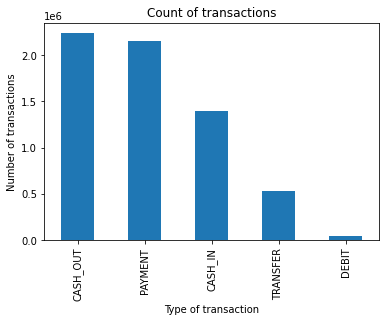

In [17]:
print(data.type.value_counts())
data.type.value_counts().plot(kind='bar')
plt.title('Count of transactions')
plt.xlabel('Type of transaction')
plt.ylabel("Number of transactions")
plt.show()

The moment of truth!

- The relevance of each feature in identifying the fraudulent transactions.

In [18]:
data.groupby('type')['isFraud'].sum()

type
CASH_IN        0
CASH_OUT    4116
DEBIT          0
PAYMENT        0
TRANSFER    4097
Name: isFraud, dtype: int64

Jackpot! 

- Clearly, fraudulent transactions take place exclusively in Cash-outs and Transfers. That means the rest of the transaction types (Cash in, Debit, Payment) are never associated with fraud. We will get rid of all observations with these transactions, which will reduce the total number of observations significantly. 

In [19]:
data_new.drop(data_new.index[data_new['type'] == 'CASH_IN'], inplace = True)

In [20]:
data_new.drop(data_new.index[data_new['type'] == 'DEBIT'], inplace = True)

In [21]:
data_new.drop(data_new.index[data_new['type'] == 'PAYMENT'], inplace = True)

In [22]:
data_new.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
2,1,TRANSFER,181.00,C1305486145,181.0,0.0,C553264065,0.0,0.00,1,0
3,1,CASH_OUT,181.00,C840083671,181.0,0.0,C38997010,21182.0,0.00,1,0
15,1,CASH_OUT,229133.94,C905080434,15325.0,0.0,C476402209,5083.0,51513.44,0,0
19,1,TRANSFER,215310.30,C1670993182,705.0,0.0,C1100439041,22425.0,0.00,0,0
24,1,TRANSFER,311685.89,C1984094095,10835.0,0.0,C932583850,6267.0,2719172.89,0,0


In [23]:
data_new.shape

(2770409, 11)

- Great! We have managed to reduce the number of observations from 6.362620e+06 to 2.770409+06.

RAM: "01010100 01101000 01100001 01101110 01101011 00100000 01111001 01101111 01110101 00100001"

I don't speak binary, but I am sure my RAM says "Thank you!" :) 

### 4.2.3 Amount

- amount - amount of the transaction in local currency.
- Let's have a Look at different amounts and try to find out if there is a correlation between the amount and wether the transaction is genuine or fraudulent. 

Statistics of the genuine and fradulent amounts. 

In [24]:
print("Statistics on the amounts transferred in genuine transactions: \n", pd.DataFrame.describe(valid.amount),"\n")
print("Statistics on the amounts transferred in fraudulent transactions: \n",pd.DataFrame.describe(fraud.amount),"\n")

Statistics on the amounts transferred in genuine transactions: 
 count    6.354407e+06
mean     1.781970e+05
std      5.962370e+05
min      1.000000e-02
25%      1.336840e+04
50%      7.468472e+04
75%      2.083648e+05
max      9.244552e+07
Name: amount, dtype: float64 

Statistics on the amounts transferred in fraudulent transactions: 
 count    8.213000e+03
mean     1.467967e+06
std      2.404253e+06
min      0.000000e+00
25%      1.270913e+05
50%      4.414234e+05
75%      1.517771e+06
max      1.000000e+07
Name: amount, dtype: float64 



- Let's plot overlayed step vs amount scatter plots and # a horizontal line showing where valid transactions behave very differently from fraud transactions.

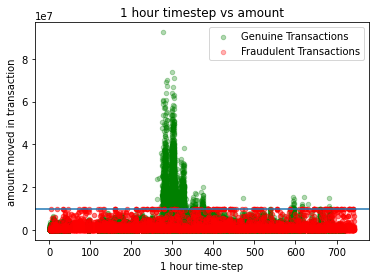

Proportion of transactions where the amount moved is greater than 10 million:  0.0008818192548464865


In [25]:
alpha = 0.3
fig,ax = plt.subplots()
valid.plot.scatter(x="step",y="amount",color="green",alpha=alpha,ax=ax,label="Genuine Transactions")
fraud.plot.scatter(x="step",y="amount",color="red",alpha=alpha,ax=ax, label="Fraudulent Transactions")

plt.title("1 hour timestep vs amount")
plt.xlabel("1 hour time-step")
plt.ylabel("amount moved in transaction")
plt.legend(loc="upper right")

plt.axhline(y=10000000)
plt.show()


print("Proportion of transactions where the amount moved is greater than 10 million: ", \
      len(data_new[data_new.amount > 10000000])/len(data_new))

Conclusions:

- Only valid transaction involved amounts larger than 10,000,000, however these transactions make up less than 0.01% of the relevant data.
- When the amounts moved is less than 10,000,000 there doesn't seem to be a large difference fraudulent and valid transactions.
- The average sum transferred in fradulent transaction is 1.467967e+06.
- Largest sum trnasferred in fradulent transaction is 1.000000e+07.
- The average sum transferred in genuine transaction is 3.141155e+05.
- Largest sum trnasferred in genuine transaction is 9.244552e+07.

### 4.2.4 nameOrig  and nameDest 

- nameOrig - customer who started the transaction.
- nameDest - customer who is the recipient of the transaction.

In [26]:
data.select_dtypes(include = ['object']).head()

,type,nameOrig,nameDest
0,PAYMENT,C1231006815,M1979787155
1,PAYMENT,C1666544295,M2044282225
2,TRANSFER,C1305486145,C553264065
3,CASH_OUT,C840083671,C38997010
4,PAYMENT,C2048537720,M1230701703


Looking at the presence of genuine and fraudulent transactions in each type of transaction.

- customer to customer (CC)
- customer to merchant (CM)
- merchant to customer (MC)
- merchant to merchant (MM)

I will add a feature called "from_to" which will help us to find out if there is a correlation between the four different types of transactions and the chance of them being fradulent.

In [27]:
data_new["from_to"] = np.nan # initializing feature column

data_new.loc[data.nameOrig.str.contains('C') & data.nameDest.str.contains('C'),"from_to"] = "CC" 
data_new.loc[data.nameOrig.str.contains('C') & data.nameDest.str.contains('M'),"from_to"] = "CM"
data_new.loc[data.nameOrig.str.contains('M') & data.nameDest.str.contains('C'),"from_to"] = "MC"
data_new.loc[data.nameOrig.str.contains('M') & data.nameDest.str.contains('M'),"from_to"] = "MM"

In [28]:
fraud = data_new[data_new["isFraud"] == 1]
valid = data_new[data_new["isFraud"] == 0]

- Seeing the counts of fraudulent and genuine transactions by type (CC,CM,MC,MM).

In [29]:
print("Fraudulent transactions by from_to: \n",fraud.from_to.value_counts())
print("\n Genuine transactions by from_to: \n",valid.from_to.value_counts())

Fraudulent transactions by from_to: 
 CC    8213
Name: from_to, dtype: int64

 Genuine transactions by from_to: 
 CC    2762196
Name: from_to, dtype: int64


- The data shows that all fraudulent transactions occur only customer to customer transactions.
- This means that we can get rid of all other transaction types; CM,MC, and MM and the 'from_to' column. 

In [30]:
data_new.drop(data_new.index[data_new['from_to'] == 'CM'], inplace = True)

In [31]:
data_new.drop(data_new.index[data_new['from_to'] == 'MC'], inplace = True)

In [32]:
data_new.drop(data_new.index[data_new['from_to'] == 'MM'], inplace = True)

In [33]:
fraud = fraud.drop('from_to', 1)
valid = valid.drop('from_to',1)
data_new = data_new.drop('from_to',1)

In [34]:
data_new.shape

(2770409, 11)

### 4.2.5 Looking at the balances before and after the transactions

- oldbalanceOrg - initial balance before the transaction.
- newbalanceOrig - new balance after the transaction.
- oldbalanceDest - initial balance recipient before the transaction. Note that there is not information for customers that start with M (Merchants).
- newbalanceDest - new balance recipient after the transaction. Note that there is not information for customers that start with M (Merchants).

Let's have a look at the number of observations with balance errors.

In [35]:
wrong_orig_bal = sum(data["oldbalanceOrg"] - data["amount"] != data["newbalanceOrig"])
wrong_dest_bal = sum(data["newbalanceDest"] + data["amount"] != data["newbalanceDest"])
print("Percentage of balance errors in the accounts sending money: ", 100 * round(wrong_orig_bal / len(data), 2))
print("Percentage of balance errors in the accounts receiving money: ", 100 * round(wrong_dest_bal / len(data), 2))

num_wrong_bal = (data["oldbalanceOrg"] - data["amount"] != data["newbalanceOrig"]) | (data["newbalanceDest"] + data["amount"] != data["newbalanceDest"])
print("Total percentage of observations with balance errors: ", 100 * round(sum(num_wrong_bal) / len(data), 2))

Percentage of balance errors in the accounts sending money:  85.0
Percentage of balance errors in the accounts receiving money:  100.0
Total percentage of observations with balance errors:  100.0


Oddly enough all observations contain balance errors. 

In [36]:
# adding features errorBalanceOrg, errorBalanceDest
data_new["errorBalanceOrg"] = data_new.newbalanceOrig + data_new.amount - data_new.oldbalanceOrg
data_new["errorBalanceDest"] = data_new.oldbalanceDest + data_new.amount - data_new.newbalanceDest

# Subsetting data into observations with fraud and valid transactions:
fraud = data_new[data_new["isFraud"] == 1]
valid = data_new[data_new["isFraud"] == 0]

In [37]:
print("Statistics of errorBalanceOrg for fraudulent transactions: \n",fraud["errorBalanceOrg"].describe())
print("\n Statistics of errorBalanceOrg for genuine transactions: \n",valid["errorBalanceOrg"].describe())

Statistics of errorBalanceOrg for fraudulent transactions: 
 count    8.213000e+03
mean     1.069233e+04
std      2.651461e+05
min     -7.450581e-09
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+07
Name: errorBalanceOrg, dtype: float64

 Statistics of errorBalanceOrg for genuine transactions: 
 count    2.762196e+06
mean     2.868035e+05
std      8.763752e+05
min     -1.000000e-02
25%      5.261343e+04
50%      1.442008e+05
75%      2.804663e+05
max      9.244552e+07
Name: errorBalanceOrg, dtype: float64


From the statistics on the errorBalanceOrg, it seems that a large proportion of the data have an error of 0 or close to zero. This is indicated by the fact that the most negative error is -7.450581e-09 which is very small and close to 0, and the 3rd quartile is 0 (that is, about 75% of the data is between -7.450581e-09 and 0). However, there are some large errors, the largest error being 1.000000e+07.

On the other hand, for valid transactions, a large proportion of the data have large errors. For instance, about 75% of the data haver errors exceeding 5.261343e+04 (the first quartile). The largest error is 9.244552e+07.

In [38]:
print("Statistics of errorBalanceDest for fraudulent transactions: \n",fraud["errorBalanceDest"].describe())
print("\n Statistics of errorBalanceDest for genuine transactions: \n",valid["errorBalanceDest"].describe())

Statistics of errorBalanceDest for fraudulent transactions: 
 count    8.213000e+03
mean     7.325093e+05
std      1.867748e+06
min     -8.875516e+06
25%      0.000000e+00
50%      2.231460e+03
75%      4.427220e+05
max      1.000000e+07
Name: errorBalanceDest, dtype: float64

 Statistics of errorBalanceDest for genuine transactions: 
 count    2.762196e+06
mean    -3.091033e+04
std      5.840943e+05
min     -7.588573e+07
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.977761e+06
Name: errorBalanceDest, dtype: float64


From the statistics of the errorBalanceDest variable, we see that there are large errors in the accounts.

Let's see what the differences look like when I plot errorBalanceOrg and errorBalanceDest together.

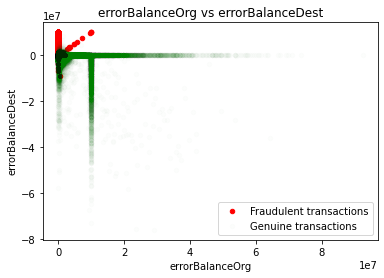

In [39]:
errors = ["errorBalanceOrg", "errorBalanceDest"]
ax = plt.subplot()

fplot = fraud.plot(x="errorBalanceOrg",y="errorBalanceDest",color="red",kind="scatter",ax=ax,label="Fraudulent transactions")
vplot = valid.plot(x="errorBalanceOrg",y="errorBalanceDest",color="green",kind="scatter",\
                   alpha=0.01,ax=ax,label="Genuine transactions")
plt.title("errorBalanceOrg vs errorBalanceDest")
plt.show()

It seems that many fraudulent transactions that are found in the top right corner where errorBalanceDest > 0, whereas transactions occur much more often when the errorBalanceDest <= 0.

In [40]:
print("Proportion of fraudulent transactions with errorBalanceDest > 0: ", len(fraud[fraud.errorBalanceDest > 0])/len(fraud))
print("Proportion of genuine transactions with errorBalanceDest > 0: ", len(valid[valid.errorBalanceDest > 0])/len(valid))
print("Proportion of fraudulent transactions with errorBalanceOrg > 0: ", len(fraud[fraud.errorBalanceOrg > 0])/len(fraud))
print("Proportion of genuine transactions with errorBalanceOrg > 0: ", len(valid[valid.errorBalanceOrg > 0])/len(valid))

Proportion of fraudulent transactions with errorBalanceDest > 0:  0.5712894192134421
Proportion of genuine transactions with errorBalanceDest > 0:  0.19744942067832985
Proportion of fraudulent transactions with errorBalanceOrg > 0:  0.006331425788384269
Proportion of genuine transactions with errorBalanceOrg > 0:  0.9067180605576143


- Since all the transactions now are customer to customer (CC), I will get rid of the columns 'nameOrig', and 'nameDest'.

In [41]:
data_new.drop('nameOrig', axis='columns', inplace=True)

In [42]:
data_new.drop('nameDest', axis='columns', inplace=True)

In [43]:
data_new.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,errorBalanceOrg,errorBalanceDest
2,1,TRANSFER,181.00,181.0,0.0,0.0,0.00,1,0,0.00,181.0
3,1,CASH_OUT,181.00,181.0,0.0,21182.0,0.00,1,0,0.00,21363.0
15,1,CASH_OUT,229133.94,15325.0,0.0,5083.0,51513.44,0,0,213808.94,182703.5
19,1,TRANSFER,215310.30,705.0,0.0,22425.0,0.00,0,0,214605.30,237735.3
24,1,TRANSFER,311685.89,10835.0,0.0,6267.0,2719172.89,0,0,300850.89,-2401220.0


Conclusion:

The spread of errors in both the balanceOrg and balanceDest variables are large, however valid transactions are much more likely to have an errorBalanceOrg > 0.

Similarly, fraudulent transactions are much more likely to have errorBalanceDest > 0 than valid transactions.

In addition, only valid transactions have errorBalanceDest > 10,000,000

These distinctions and probably more, make errorBalanceDest and errorBalanceOrg potentially effective features.

### 4.2.6 isFraud 

- isFraud - This is the transactions made by the fraudulent agents inside the simulation. In this specific dataset the fraudulent behavior of the agents aims to profit by taking control or customers accounts and try to empty the funds by transferring to another account and then cashing out of the system.

In [44]:
# Number of genuine and number of fraudulent transactions. 
print(data.isFraud.value_counts())

0    6354407
1       8213
Name: isFraud, dtype: int64


### 4.2.7 isFlaggedFraud

- isFlaggedFraud - The business model aims to control massive transfers from one account to another and flags illegal attempts. An illegal attempt in this dataset is an attempt to transfer more than 200.000 in a single transaction.

I fail to see the logic in the above presumtion, and since it has only manage to flag 16 fradulent transaction, I think this feature is utterly useless, so we will get rid of it. 

In [45]:
# Number of trasactions flagged as fraudulent. 
print(data.isFlaggedFraud.value_counts())

0    6362604
1         16
Name: isFlaggedFraud, dtype: int64


In [46]:
data_new.drop('isFlaggedFraud', axis='columns', inplace=True)

In [47]:
data_new.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,errorBalanceOrg,errorBalanceDest
2,1,TRANSFER,181.00,181.0,0.0,0.0,0.00,1,0.00,181.0
3,1,CASH_OUT,181.00,181.0,0.0,21182.0,0.00,1,0.00,21363.0
15,1,CASH_OUT,229133.94,15325.0,0.0,5083.0,51513.44,0,213808.94,182703.5
19,1,TRANSFER,215310.30,705.0,0.0,22425.0,0.00,0,214605.30,237735.3
24,1,TRANSFER,311685.89,10835.0,0.0,6267.0,2719172.89,0,300850.89,-2401220.0


In [48]:
data_new.shape

(2770409, 10)

Alright! We have explored the different features, and got rid of the a lot of useless data. Now it's time to train some models and see which one is going to be crowned the 'Fraud Buster'. 

## 5. Pre-processing Data

### 5.1 Handling Categorical Variables

Many algorithms require that all elements used in the computation are numbers.

For that reason, the categorical variables encoded as string must be encoded as numbers. Since there is no "order"/"hierarchy" in the type variable, the method I will use to numerically encode categorical variables is called One-hot encoding.

One-Hot encoding involves creating indicator variables for each category in a categorical variable.

- The only categorical variable in our dataset is 'type', so I will use One-hot encoding to change 'CASH_OUT' to 0s and 'TRANSFER' to 1s. 

In [49]:
data_new = pd.get_dummies(data_new,prefix=['type'])

In [50]:
data_new.head()

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,errorBalanceOrg,errorBalanceDest,type_CASH_OUT,type_TRANSFER
2,1,181.00,181.0,0.0,0.0,0.00,1,0.00,181.0,0,1
3,1,181.00,181.0,0.0,21182.0,0.00,1,0.00,21363.0,1,0
15,1,229133.94,15325.0,0.0,5083.0,51513.44,0,213808.94,182703.5,1,0
19,1,215310.30,705.0,0.0,22425.0,0.00,0,214605.30,237735.3,0,1
24,1,311685.89,10835.0,0.0,6267.0,2719172.89,0,300850.89,-2401220.0,0,1


### 5.2 Splitting and Standardizing Data.

Similarly, many, if not all, machine learning algorithms perform better when the data is standardized/normalized (when all values are between 0 and 1 inclusive).

We will do this to standardize the data without standardizing the target variable isFraud.

### 5.2.1 Setting random_state and seed so that the training/testing splits and model results are reproducible. 

- It doesn't matter if the random_state is 0 or 1 or any other integer. 
- What matters is that it should be set the same value, if you want to validate your processing over multiple runs of the code

In [51]:
RandomState = 1
random.seed(2)

### 5.2.2 Creating training, validation, and testing sets.

We will also split the data up into training sets and testing sets. A common split is to separate 80% of the data as the training set and the rest as the testing set. However since our data set is quite large we use 80% of the data as a training set, 10% as validation set, and 10% of tha data as a testing set.

In [52]:
attributes = data_new.drop("isFraud", 1)
target = data_new.isFraud

attributes_train, attributes_test, target_train, target_test = train_test_split(attributes, target)

attributes_train, attributes_test, target_train, target_test = train_test_split(attributes, target, test_size = 0.1, random_state = 1, stratify = target)

attributes_train, attributes_val, target_train, target_val = train_test_split(attributes_train, target_train,  test_size = 0.111111 , random_state = 1,  stratify = target_train)

In [53]:
data_new.shape

(2770409, 11)

In [54]:
data_new.columns

Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'isFraud', 'errorBalanceOrg', 'errorBalanceDest',
       'type_CASH_OUT', 'type_TRANSFER'],
      dtype='object')

In [55]:
target.shape

(2770409,)

### 5.2.3 Normalizing data so that all variables follow the same scale (0 to 1)

In [56]:
scaler = StandardScaler()

Fit only to the training data

In [57]:
scaler.fit(attributes_train)

StandardScaler()

Now we will apply the transformations to the data.

In [58]:
attributes_train = scaler.transform(attributes_train)
attributes_test = scaler.transform(attributes_test)

In [59]:
data_new.shape

(2770409, 11)

In [60]:
attributes.shape

(2770409, 10)

In [61]:
target.shape

(2770409,)

In [62]:
attributes_train.shape

(2216327, 10)

In [63]:
target_train.shape

(2216327,)

In [64]:
attributes_test.shape

(277041, 10)

In [65]:
target_test.shape

(277041,)

In [66]:
attributes_val.shape

(277041, 10)

In [67]:
target_val.shape

(277041,)

## 6 Model Selection

### Evaluating the models

### Accuracy classification score

In multilabel classification, this function computes subset accuracy: the set of labels predicted for a sample must exactly match the corresponding set of labels in y_true.

#### Sample code 

In [70]:
# from sklearn.metrics import accuracy_score
# y_pred = [0, 2, 1, 3]
# y_true = [0, 1, 2, 3]
# accuracy_score(y_true, y_pred)
# 0.5
# accuracy_score(y_true, y_pred, normalize=False)
# 2

### F1 score, also known as balanced F-score or F-measure

The F1 score can be interpreted as a weighted average of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0. The relative contribution of precision and recall to the F1 score are equal. The formula for the F1 score is:

#### Formula 

F1 = 2 * (precision * recall) / (precision + recall)

### Precision-Recall 

Precision_Recall is a useful measure of success of prediction when the classes are very imbalanced. In information retrieval, precision is a measure of result relevancy, while recall is a measure of how many truly relevant results are returned.

The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), as well as returning a majority of all positive results (high recall).

#### Compute the average precision score

In [71]:
# from sklearn.metrics import average_precision_score
# average_precision = average_precision_score(y_test, y_score)
# print('Average precision-recall score: {0:0.2f}'.format(average_precision))

#### Plot the Precision-Recall curve

In [72]:
# from sklearn.metrics import precision_recall_curve
# from sklearn.metrics import plot_precision_recall_curve
# import matplotlib.pyplot as plt

# disp = plot_precision_recall_curve(classifier, X_test, y_test)
# disp.ax_.set_title('2-class Precision-Recall curve: ' 'AP={0:0.2f}'.format(average_precision))

### Confusion Matrix

By definition a confusion matrix C is such that Ci,j is equal to the number of observations known to be in group i and predicted to be in group j.

Thus in binary classification, the count of true negatives is C0,0, false negatives is C1,0, true positives is C1,1 and false positives is Co,1.

#### Sample code

In [73]:
# from sklearn.metrics import confusion_matrix
# y_true = [2, 0, 2, 2, 0, 1]
# y_pred = [0, 0, 2, 2, 0, 2]
# confusion_matrix(y_true, y_pred)
# array([[2, 0, 0],
#        [0, 0, 1], 
#        [1, 0, 2]])

### Precision

The precision is the ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives. 
The precision is intuitively the ability of the classifier not to label as positive a sample that is negative.
The best value is 1 and the worst value is 0.

#### Sample code 

In [74]:
# from sklearn.metrics import precision_score
# y_true = [0, 1, 2, 0, 1, 2]
# y_pred = [0, 2, 1, 0, 0, 1]
# precision_score(y_true, y_pred, average='macro')
# 0.22...
# precision_score(y_true, y_pred, average='micro')
# 0.33...
# precision_score(y_true, y_pred, average='weighted')
# 0.22...
# precision_score(y_true, y_pred, average=None)
# array([0.66..., 0.        , 0.        ])
# y_pred = [0, 0, 0, 0, 0, 0]
# precision_score(y_true, y_pred, average=None)
# array([0.33..., 0.        , 0.        ])
# precision_score(y_true, y_pred, average=None, zero_division=1)
# array([0.33..., 1.        , 1.        ])

### Recall

The recall is the ratio tp / (tp + fn) where tp is the number of true positives and fn the number of false negatives. 
The recall is intuitively the ability of the classifier to find all the positive samples.
The best value is 1 and the worst value is 0.

#### Sample code

In [75]:
# from sklearn.metrics import recall_score 
# y_true = [0, 1, 2, 0, 1, 2]
# y_pred = [0, 2, 1, 0, 0, 1]
# recall_score(y_true, y_pred, average='macro')
# 0.33...
# recall_score(y_true, y_pred, average='micro')
# 0.33...
# recall_score(y_true, y_pred, average='weighted')
# 0.33...
# recall_score(y_true, y_pred, average=None)
# array([1., 0., 0.])
# y_true = [0, 0, 0, 0, 0, 0]
# recall_score(y_true, y_pred, average=None)
# array([0.5, 0. , 0. ])
# recall_score(y_true, y_pred, average=None, zero_division=1)
# array([0.5, 1. , 1. ])

### Receiver Operating Characteristic Curve (ROC AUC) from prediction scores

ROC curves typically feature true positive rate on the Y axis, and false positive rate on the X axis. This means that the top left corner of the plot is the “ideal” point - a false positive rate of zero, and a true positive rate of one. This is not very realistic, but it does mean that a larger area under the curve (AUC) is usually better.

The “steepness” of ROC curves is also important, since it is ideal to maximize the true positive rate while minimizing the 
false positive rate. ROC curves are typically used in binary classification to study the output of a classifier.  
In order to extend ROC curve and ROC area to multi-label classification, it is necessary to binarize the output. 
One ROC curve can be drawn per label, but one can also draw a ROC curve by considering each element of the label indicator  matrix as a binary prediction (micro-averaging).

Another evaluation measure for multi-label classification is macro-averaging, which gives equal weight to the classification 
of each label.

#### Sample code

In [76]:
# import numpy as np
# from sklearn.metrics import roc_auc_score
# y_true = np.array([0, 0, 1, 1])
# y_scores = np.array([0.1, 0.4, 0.35, 0.8])
# roc_auc_score(y_true, y_scores)
# 0.75

## 6.1 Logistic Regression

Logistic Regression is a Machine Learning algorithm which is used for the classification problems, it is a predictive analysis algorithm and based on the concept of probability.

What are the types of logistic regression
Binary (eg. Tumor Malignant or Benign)
Multi-linear functions failsClass (eg. Cats, dogs or horses)

Logistic Regression Assumptions
    - Binary logistic regression requires the dependent variable to be binary.
    - For a binary regression, the factor level 1 of the dependent variable should represent the desired outcome.
    - Only the meaningful variables should be included.
    - The independent variables should be independent of each other. That is, the model should have little or no multicollinearity.
    - The independent variables are linearly related to the log odds.
    - Logistic regression requires quite large sample sizes.

We can call a Logistic Regression a Linear Regression model but the Logistic Regression uses a more complex cost function, this cost function can be defined as the ‘Sigmoid function’ or also known as the ‘logistic function’ instead of a linear function.

The hypothesis of logistic regression tends it to limit the cost function between 0 and 1. Therefore linear functions fail to represent it as it can have a value greater than 1 or less than 0 which is not possible as per the hypothesis of logistic regression.

Decision Boundary
We expect our classifier to give us a set of outputs or classes based on probability when we pass the inputs through a prediction function and returns a probability score between 0 and 1.

    For Example, We have 2 classes, let’s take them like cats and dogs(1 — dog , 0 — cats). We basically decide with a threshold value above which we classify values into Class 1 and of the value goes below the threshold then we classify it in Class 2.
    
Cost Function
Cost function represents optimization objective i.e. we create a cost function and minimize it so that we can develop an accurate model with minimum error.

Gradient Descent
Now the question arises, how do we reduce the cost value. Well, this can be done by using Gradient Descent. The main goal of Gradient descent is to minimize the cost value.

### Tuning the model using hyperparameters

Machine learning algorithms have hyperparameters that allow you to tailor the behavior of the algorithm to your specific dataset.

Hyperparameters are different from parameters, which are the internal coefficients or weights for a model found by the learning algorithm. Unlike parameters, hyperparameters are specified by the practitioner when configuring the model.

Typically, it is challenging to know what values to use for the hyperparameters of a given algorithm on a given dataset, therefore it is common to use random or grid search strategies for different hyperparameter values.

The more hyperparameters of an algorithm that you need to tune, the slower the tuning process. Therefore, it is desirable to select a minimum subset of model hyperparameters to search or tune.

Not all model hyperparameters are equally important. Some hyperparameters have an outsized effect on the behavior, and in turn, the performance of a machine learning algorithm.

### Regularization

Regularization is a technique to solve the problem of overfitting in a machine learning algorithm by penalizing the cost function. It does so by using an additional penalty term in the cost function.
There are two types of regularization techniques:
- Lasso or L1 Regularization
- Ridge or L2 Regularization

### 6.1.1 Logistic Regression

In [77]:
logistic_regression = LogisticRegression()

In [78]:
logistic_regression.fit(attributes_train, target_train)

LogisticRegression()

In [79]:
target_pred = logistic_regression.predict(attributes_val)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logistic_regression.score(attributes_val, target_val)))

Accuracy of logistic regression classifier on test set: 0.99


In [80]:
confusion_matrix = confusion_matrix(target_val, target_pred)
print(confusion_matrix)

[[273346   2874]
 [   819      2]]


Compute precision, recall, F-measure and support

- The precision is the ratio tp/(tp + fp) where tp is the number of true positives and fp the number of false positives. The precision is intuitively the ability of the classifier to not label a sample as positive if it is negative.
- The recall is the ratio tp/(tp + fn) where tp is the number of true positives and fn the number of false negatives. The recall is intuitively the ability of the classifier to find all the positive samples.
- The F-beta score can be interpreted as a weighted harmonic mean of the precision and recall, where an F-beta score reaches its best value at 1 and worst score at 0.
- The F-beta score weights the recall more than the precision by a factor of beta. beta = 1.0 means recall and precision are equally important.
- The support is the number of occurrences of each class in target_val.

In [81]:
print(classification_report(target_val, target_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    276220
           1       0.00      0.00      0.00       821

    accuracy                           0.99    277041
   macro avg       0.50      0.50      0.50    277041
weighted avg       0.99      0.99      0.99    277041



ROC Curve

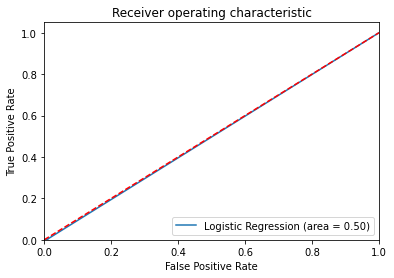

In [82]:
logistic_regression_roc_auc = roc_auc_score(target_val, logistic_regression.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, logistic_regression.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logistic_regression_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### 6.1.2 Tuning the Logistic Regression Model

Logistic regression does not really have any critical hyperparameters to tune.

Sometimes, you can see useful differences in performance or convergence with different solvers (solver).

solver in [‘newton-cg’, ‘lbfgs’, ‘liblinear’, ‘sag’, ‘saga’]
Regularization (penalty) can sometimes be helpful.

penalty in [‘none’, ‘l1’, ‘l2’, ‘elasticnet’]
Note: not all solvers support all regularization terms.

The C parameter controls the penality strength, which can also be effective.

C in [100, 10, 1.0, 0.1]

For the full list of hyperparameters, see:
sklearn.linear_model.LogisticRegression API.

The example below demonstrates grid searching the key hyperparameters for LogisticRegression on a synthetic binary classification dataset.

In [83]:
# define models and parameters
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(attributes_train, target_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.998354 using {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.998354 (0.000060) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.998354 (0.000060) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.998354 (0.000060) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.998352 (0.000060) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.998352 (0.000060) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.998352 (0.000060) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.998342 (0.000057) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.998342 (0.000057) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.998339 (0.000053) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.998309 (0.000061) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.998309 (0.000061) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.998294 (0.000058) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}


Note: Your results may vary given the stochastic nature of the algorithm or evaluation procedure, or differences in numerical precision. Consider running the example a few times and compare the average outcome.

Running the example prints the best result as well as the results from all combinations evaluated.

### 6.1.3 Best Logistic Regression Model

In [84]:
best_logistic_regression = LogisticRegression()
solver = ['newton-cg']
penalty = ['l2']
c_value = [100]

In [85]:
best_logistic_regression.fit(attributes_train, target_train)

LogisticRegression()

In [88]:
best_logistic_target_pred = best_logistic_regression.predict(attributes_val)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(best_logistic_regression.score(attributes_val, target_val)))

Accuracy of logistic regression classifier on test set: 0.99


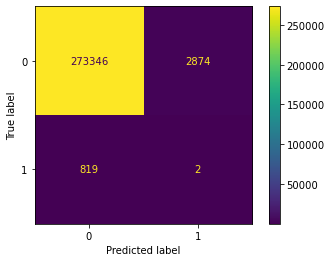

In [98]:
plot_confusion_matrix(best_logistic_regression, attributes_val, target_val)
plt.show()

In [100]:
print(classification_report(target_val, best_logistic_target_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    276220
           1       0.00      0.00      0.00       821

    accuracy                           0.99    277041
   macro avg       0.50      0.50      0.50    277041
weighted avg       0.99      0.99      0.99    277041



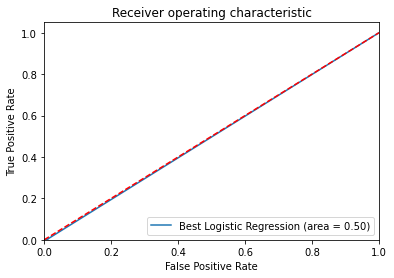

In [101]:
best_logistic_regression_roc_auc = roc_auc_score(target_val, best_logistic_regression.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, best_logistic_regression.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Best Logistic Regression (area = %0.2f)' % best_logistic_regression_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### 6.1.4 Logistic Regression with Polynomial Features

In [ ]:
# polynomial_features = PolynomialFeatures(degree = 4).fit_transform(attributes_train, target_train)

Ooops! Let's forget about the Polynomial Features for now, shall we? At the end of the day a score of 0.998347025840859 on the Logistig Regression is good enough for my 7 year old laptop. The Polynomial Features doesn't even guarantee a higher score, it might as well be lower. So at this particular case we will leave it at that, and move on to out next model, our beloved Decision Tree.

## 6.2 Decision Tree

### 6.2.1 Decision Tree

In [102]:
tree = DecisionTreeClassifier()

In [103]:
tree.fit(attributes_train, target_train)

DecisionTreeClassifier()

In [104]:
tree_target_pred = tree.predict(attributes_val)
print('Accuracy of Decision Tree Classifier on test set: {:.2f}'.format(tree.score(attributes_val, target_val)))

Accuracy of Decision Tree Classifier on test set: 0.00


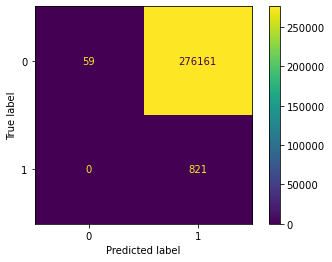

In [105]:
plot_confusion_matrix(tree, attributes_val, target_val)
plt.show()

In [107]:
print(classification_report(target_val, tree_target_pred))

              precision    recall  f1-score   support

           0       1.00      0.00      0.00    276220
           1       0.00      1.00      0.01       821

    accuracy                           0.00    277041
   macro avg       0.50      0.50      0.00    277041
weighted avg       1.00      0.00      0.00    277041



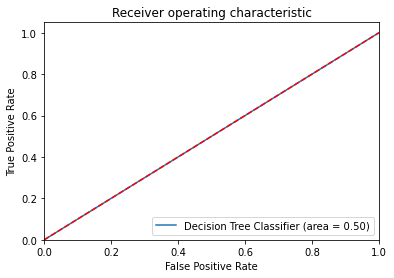

In [108]:
tree_roc_auc = roc_auc_score(target_val, tree.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, tree.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Decision Tree Classifier (area = %0.2f)' % tree_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### 6.2.2 Tuning the Decision Tree

In [115]:
# define models and parapeters
model = BaggingClassifier()
n_estimators = [10, 100, 1000]
# define grid search
grid = dict(n_estimators=n_estimators)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(attributes_train, target_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.999977 using {'n_estimators': 100}
0.999977 (0.000007) with: {'n_estimators': 10}
0.999977 (0.000004) with: {'n_estimators': 100}
0.999977 (0.000005) with: {'n_estimators': 1000}


Let's have a look at the tree!

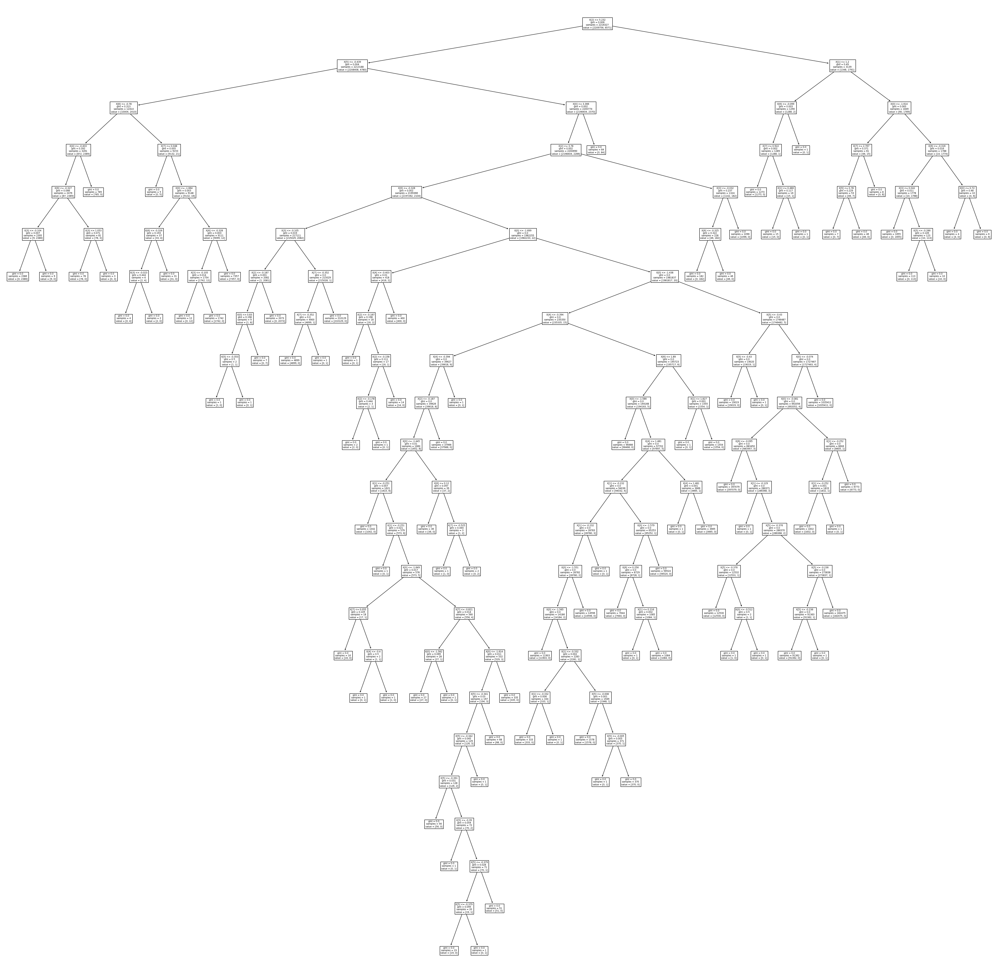

In [116]:
plt.figure(figsize = (50, 50))
plot_tree(tree)
plt.show()

This looks like one of the first images from Hubble (Yes, I am old enough to remember!). I don't know about your eyes, but mine even with glasses can't cut it. From what I can see this tree is very imballanced and needs prunning.

### 6.2.3 Best Decision Tree

In [159]:
best_tree = DecisionTreeClassifier(max_depth = 2)
n_estimators = [100]

In [160]:
best_tree.fit(attributes_train, target_train)

DecisionTreeClassifier(max_depth=2)

In [161]:
best_tree_target_pred = best_tree.predict(attributes_val)
print('Accuracy of the Best Decision Tree Classifier on test set: {:.2f}'.format(best_tree.score(attributes_val, target_val)))

Accuracy of the Best Decision Tree Classifier on test set: 0.48


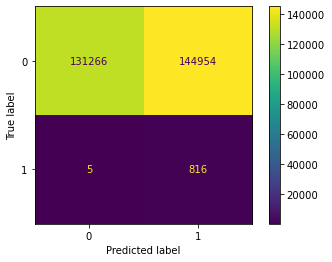

In [162]:
plot_confusion_matrix(best_tree, attributes_val, target_val)
plt.show()

In [163]:
print(classification_report(target_val, best_tree_target_pred))

              precision    recall  f1-score   support

           0       1.00      0.48      0.64    276220
           1       0.01      0.99      0.01       821

    accuracy                           0.48    277041
   macro avg       0.50      0.73      0.33    277041
weighted avg       1.00      0.48      0.64    277041



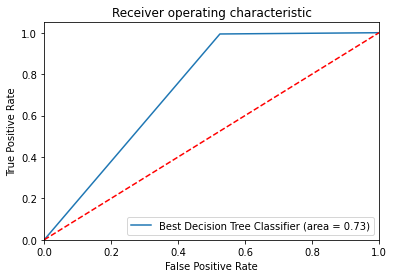

In [164]:
best_tree_roc_auc = roc_auc_score(target_val, best_tree.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, best_tree.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Best Decision Tree Classifier (area = %0.2f)' % best_tree_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

## 6.3 Random Forest

### 6.3.1 Random Forest

In [82]:
forest = RandomForestClassifier(max_depth = 2)

In [83]:
forest.fit(attributes_train, target_train)

RandomForestClassifier(max_depth=2)

In [87]:
forest_target_pred = forest.predict(attributes_val)
print('Accuracy of Random Forest Classifier on test set: {:.2f}'.format(forest.score(attributes_val, target_val)))

Accuracy of Random Forest Classifier on test set: 0.98


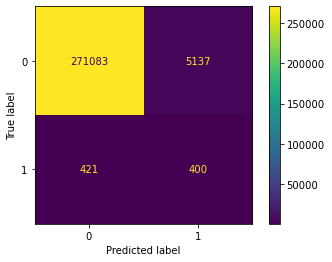

In [88]:
plot_confusion_matrix(forest, attributes_val, target_val)
plt.show()

In [89]:
print(classification_report(target_val, forest_target_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99    276220
           1       0.07      0.49      0.13       821

    accuracy                           0.98    277041
   macro avg       0.54      0.73      0.56    277041
weighted avg       1.00      0.98      0.99    277041



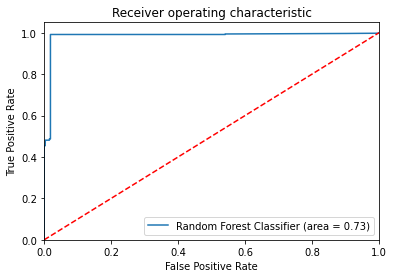

In [90]:
forest_roc_auc = roc_auc_score(target_val, forest.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, forest.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Random Forest Classifier (area = %0.2f)' % forest_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### 6.3.2 Tuning the Random Forest

In [91]:
# define models and parameters
model = RandomForestClassifier(max_depth = 2)
n_estimators = [10, 100, 1000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(attributes_train, target_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.997698 using {'max_features': 'sqrt', 'n_estimators': 10}
0.997698 (0.000139) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.997516 (0.000037) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.997507 (0.000037) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.997561 (0.000063) with: {'max_features': 'log2', 'n_estimators': 10}
0.997514 (0.000070) with: {'max_features': 'log2', 'n_estimators': 100}
0.997506 (0.000045) with: {'max_features': 'log2', 'n_estimators': 1000}


### 6.3.3 Best Random Forest

In [92]:
best_forest = RandomForestClassifier(max_depth = 2)
n_estimators = [10]
max_features = ['sqrt']

In [93]:
best_forest.fit(attributes_train, target_train)

RandomForestClassifier(max_depth=2)

In [94]:
best_forest_target_pred = best_forest.predict(attributes_val)
print('Accuracy of Best Random Forest Classifier on test set: {:.2f}'.format(best_forest.score(attributes_val, target_val)))

Accuracy of Best Random Forest Classifier on test set: 0.48


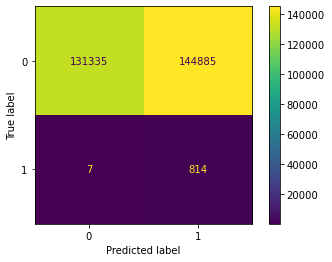

In [95]:
plot_confusion_matrix(best_forest, attributes_val, target_val)
plt.show()

In [96]:
print(classification_report(target_val, best_forest_target_pred))

              precision    recall  f1-score   support

           0       1.00      0.48      0.64    276220
           1       0.01      0.99      0.01       821

    accuracy                           0.48    277041
   macro avg       0.50      0.73      0.33    277041
weighted avg       1.00      0.48      0.64    277041



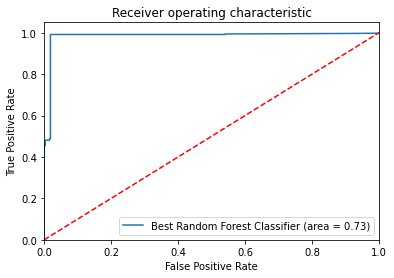

In [97]:
best_forest_roc_auc = roc_auc_score(target_val, best_forest.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, forest.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Best Random Forest Classifier (area = %0.2f)' % best_forest_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

## 6.4 K-Nearest Neighbors (KNN)
The most important hyperparameter for KNN is the number of neighbors (n_neighbors).

Test values between at least 1 and 21, perhaps just the odd numbers.

n_neighbors in [1 to 21]
It may also be interesting to test different distance metrics (metric) for choosing the composition of the neighborhood.

metric in [‘euclidean’, ‘manhattan’, ‘minkowski’]
For a fuller list see:

sklearn.neighbors.DistanceMetric API
It may also be interesting to test the contribution of members of the neighborhood via different weightings (weights).

weights in [‘uniform’, ‘distance’]
For the full list of hyperparameters, see:

sklearn.neighbors.KNeighborsClassifier API.
The example below demonstrates grid searching the key hyperparameters for KNeighborsClassifier on a synthetic binary classification dataset.

### 6.4.1 K-Nearest Neighbors

In [99]:
knn_classifier = KNeighborsClassifier()

In [100]:
knn_classifier.fit(attributes_train, target_train)

KNeighborsClassifier()

In [101]:
knn_target_pred = knn_classifier.predict(attributes_val)
print('Accuracy of K-Nearest Neighbors on test set: {:.2f}'.format(knn_classifier.score(attributes_val, target_val)))

Accuracy of K-Nearest Neighbors on test set: 0.94


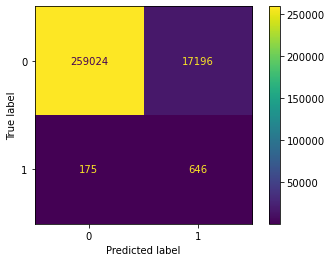

In [102]:
plot_confusion_matrix(knn_classifier, attributes_val, target_val)
plt.show()

In [104]:
print(classification_report(target_val, knn_target_pred))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97    276220
           1       0.04      0.79      0.07       821

    accuracy                           0.94    277041
   macro avg       0.52      0.86      0.52    277041
weighted avg       1.00      0.94      0.96    277041



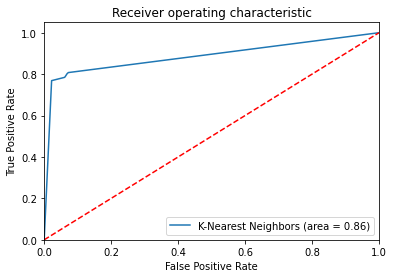

In [105]:
knn_classifier_roc_auc = roc_auc_score(target_val, knn_classifier.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, knn_classifier.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='K-Nearest Neighbors (area = %0.2f)' % knn_classifier_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### 6.4.2 Tunning the KNN-Classifier

In [ ]:
# define models and parameters
model = KNeighborsClassifier()
n_neighbors = range(1, 3, 5)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
# define grid search
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(attributes_train, target_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

### 6.4.3 Best K-Nearest Neighbors

In [67]:
best_knn_classifier = KNeighborsClassifier()
n_neighbors = range(3)
weights = ['distance']
metric = ['euclidean']

In [ ]:
best_knn_classifier.fit(attributes_train, target_train)

In [ ]:
target_pred = best_knn_classifier.predict(attributes_val)
print('Accuracy of Best K-Nearest Neighbors on test set: {:.2f}'.format(best_knn_classifier.score(attributes_val, target_val)))

In [ ]:
confusion_matrix(target_val, best_knn_classifier.predict(attributes_val))
print(confusion_matrix)

In [ ]:
print(classification_report(target_val, best_knn_classifier.predict(attributes_val))

In [ ]:
best_knn_classifier_roc_auc = roc_auc_score(target_val, best_knn_classifier.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, best_knn_classifier.predict_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Best K-Nearest Neighbors (area = %0.2f)' % best_knn_classifier_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

## 6.5 SVM - Support Vector Machines

### 6.5.1 SVM

In [ ]:
svm = SVC()

In [ ]:
svm.fit(attributes_train, target_train)

In [ ]:
target_pred = svm.predict(attributes_val)
print('Accuracy of SVM on test set: {:.2f}'.format(svm.score(attributes_val, target_val)))

In [ ]:
# confusion_matrix(target_val, svm.predict(attributes_val))
# print(confusion_matrix)

In [ ]:
print(classification_report(target_val, svm.predict(attributes_val))

In [ ]:
svm_roc_auc = roc_auc_score(target_val, svm.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, svm_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='SVM Classifier (area = %0.2f)' % svm_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### 6.5.2 Tunning the SVM

In [ ]:
# define model and parameters
model = SVC()
kernel = ['poly', 'rbf', 'sigmoid']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(attributes_train, target_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

### 6.5.3 Best SVM

In [ ]:
best_svm = SVC()

In [ ]:
best_svm.fit(attributes_train, target_train)

In [ ]:
target_pred = best_svm.predict(attributes_val)
print('Accuracy of the Best SVM on test set: {:.2f}'.format(best_svm.score(attributes_val, target_val)))

In [ ]:
confusion_matrix(target_val, best_svm.predict(attributes_val))
print(confusion_matrix)

In [ ]:
print(classification_report(target_val, best_svm.predict(attributes_val))

In [ ]:
best_svm_roc_auc = roc_auc_score(target_val, best_svm.predict(attributes_val))
fpr, tpr, thresholds = roc_curve(target_val, best_svm_proba(attributes_val)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Best SVM Classifier (area = %0.2f)' % best_svm_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

## 7. Testing the best classifier with the unknown testing data

In [68]:
best_forest = RandomForestClassifier(max_depth = 2)
n_estimators = [10]
max_features = ['sqrt']

In [69]:
best_forest.fit(attributes_train, target_train)

RandomForestClassifier(max_depth=2)

In [70]:
best_forest_target_pred = best_forest.predict(attributes_val)
print('Accuracy of Best Random Forest Classifier on test set: {:.2f}'.format(best_forest.score(attributes_test, target_test)))

Accuracy of Best Random Forest Classifier on test set: 1.00


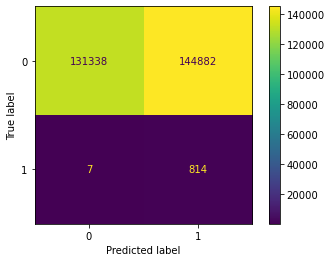

In [71]:
plot_confusion_matrix(best_forest, attributes_val, target_val)
plt.show()

In [72]:
print(classification_report(target_val, best_forest_target_pred))

              precision    recall  f1-score   support

           0       1.00      0.48      0.64    276220
           1       0.01      0.99      0.01       821

    accuracy                           0.48    277041
   macro avg       0.50      0.73      0.33    277041
weighted avg       1.00      0.48      0.64    277041



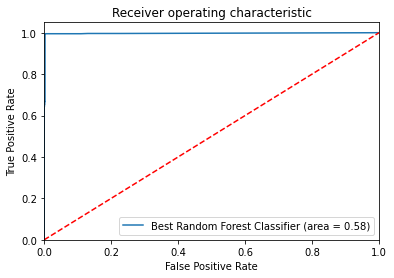

In [75]:
best_forest_roc_auc = roc_auc_score(target_test, best_forest.predict(attributes_test))
fpr, tpr, thresholds = roc_curve(target_test, best_forest.predict_proba(attributes_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Best Random Forest Classifier (area = %0.2f)' % best_forest_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

## 8. Conclusion

Fom our experiment what we have found out is that machines are much better than humans at processing large datasets. They are able to detect and recognize thousands of patterns on a user’s purchasing journey instead of the few captured by creating rules. We can predict fraud in a large volume of transactions by applying cognitive computing technologies to raw data. This is the reason why we should use machine learning algorithms for preventing fraud. The three factors which explain the importance of machine learning are;

1. Speed – Machine learning can evaluate huge numbers of transactions in real time. It is continuously analyzing and processing new data.

2. Scale – Machine learning algorithms and models become more effective with increasing data sets. Machine-learning improves with more data because the ML model can pick out the differences and similarities between multiple behaviors. Once told which transactions are genuine and which are fraudulent, the systems can work through them and begin to pick out those which fit either bucket.

3. Efficiency – Contrary to humans, machines can perform repetitive tasks. Similarly, ML algorithms do the dirty work of data analysis and only escalate decisions to humans when their input adds insights. ML can often be more effective than humans at detecting subtle or non-intuitive patterns to help identify fraudulent transactions. 

### Fraudsters, say hello to the ML algorithms! 

## 9. Pickling

In [78]:
filename = 'Fraud Detection with Machine Learning'
outfile = open(filename,'wb')

In [80]:
pickle.dump(filename,outfile)
outfile.close()

## 10. Resourses

### Data
- https://www.kaggle.com/ntnu-testimon/paysim1
    
### Libraries
- https://matplotlib.org/
- https://pandas.pydata.org/
- https://numpy.org/
- https://scikit-learn.org/stable/
    
### Train test split 
- https://towardsdatascience.com/train-validation-and-test-sets-72cb40cba9e7
- https://towardsdatascience.com/train-test-split-and-cross-validation-in-python-80b61beca4b6c 

### Evaluate Machine Learning Algorithms in Python
- https://machinelearningmastery.com/metrics-evaluate-machine-learning-algorithms-python/

### Logistic Regression
- https://towardsdatascience.com/introduction-to-logistic-regression-66248243c148
- https://towardsdatascience.com/building-a-logistic-regression-in-python-step-by-step-becd4d56c9c8

### Hyperparameters for classification
- https://machinelearningmastery.com/hyperparameters-for-classification-machine-learning-algorithms/

### Random Forest
- https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74